# A Simple Diffusion Model with Unet

**Sources:**
- YouTube tutorial [Diffusion models from scratch in PyTorch](https://www.youtube.com/watch?v=a4Yfz2FxXiY&list=PLZG16HSni1tt4uhkrFVHeFBWCUZLaCnUw&index=4)
- Github implementation [Denoising Diffusion Pytorch](https://github.com/lucidrains/denoising-diffusion-pytorch)
- Niels Rogge, Kashif Rasul, [Huggingface notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=3a159023)
- Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt

# PATH_TO_DATA = "/content/drive/MyDrive/Studia/proj/data/OCTDL"
PATH_TO_DATA = "/content/drive/MyDrive/Studia/proj/augmented_data/"

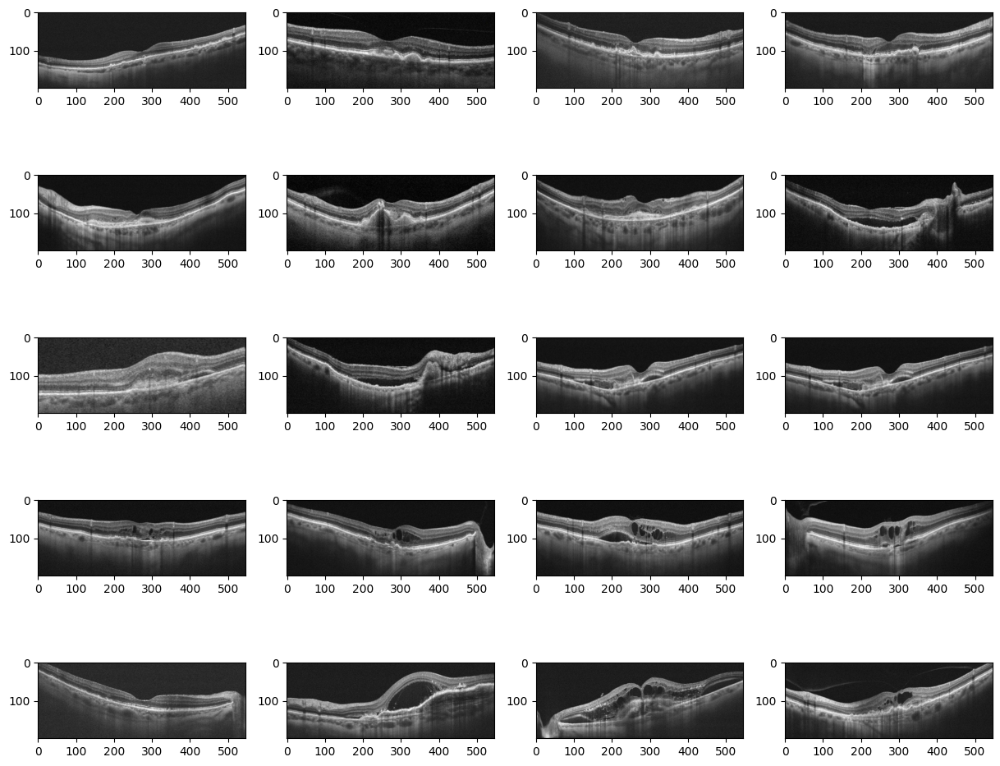

In [ ]:
def show_images(datset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15))
    for i, img in enumerate(data):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

data = torchvision.datasets.ImageFolder(PATH_TO_DATA)
show_images(data)

# Building the Diffusion Model


## Step 1: The forward process = Noise scheduler




We first need to build the inputs for our model, which are more and more noisy images. Instead of doing this sequentially, we can use the closed form provided in the papers to calculate the image for any of the timesteps individually.

**Key Takeaways**:
- The noise-levels/variances can be pre-computed
- There are different types of variance schedules
- We can sample each timestep image independently (Sums of Gaussians is also Gaussian)
- No model is needed in this forward step

In [ ]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02):
    return torch.linspace(start, end, timesteps)

def get_index_from_list(vals, t, x_shape):
    """
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """
    Takes an image and a timestep as input and
    returns the noisy version of it
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)


# Define beta schedule
T = 500
betas = linear_beta_schedule(timesteps=T)

# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)
posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

In [ ]:
from torchvision import transforms
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Grayscale(num_output_channels=1),
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1]
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1]
    ]
    data_transform = transforms.Compose(data_transforms)

    dataset = torchvision.datasets.ImageFolder(PATH_TO_DATA, transform=data_transform)
    return dataset
def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :]
    plt.imshow(reverse_transforms(image), cmap='gray')

data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

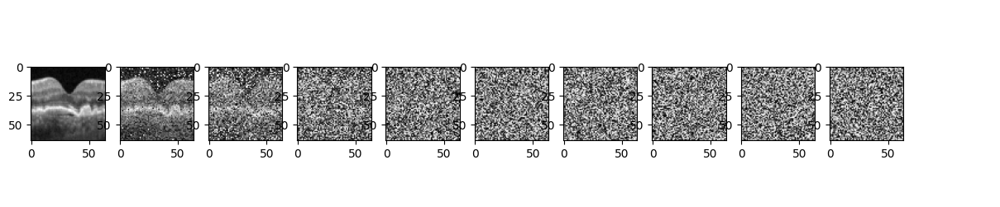

In [ ]:
# Simulate forward diffusion
image = next(iter(dataloader))[0]

plt.figure(figsize=(15,3))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(1, num_images+1, int(idx/stepsize) + 1)
    img, noise = forward_diffusion_sample(image, t)
    show_tensor_image(img)

## Step 2: The backward process = U-Net



For a great introduction to UNets, have a look at this post: https://amaarora.github.io/2020/09/13/unet.html.


**Key Takeaways**:
- We use a simple form of a UNet for to predict the noise in the image
- The input is a noisy image, the ouput the noise in the image
- Because the parameters are shared accross time, we need to tell the network in which timestep we are
- The Timestep is encoded by the transformer Sinusoidal Embedding
- We output one single value (mean), because the variance is fixed


In [ ]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp = nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2 * in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU()

    def forward(self, x, t):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(...,) + (None,) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture with class conditioning.
    """
    def __init__(self, num_classes):
        super().__init__()
        image_channels = 1
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1
        time_emb_dim = 32

        # Time and class embedding
        self.time_mlp = nn.Sequential(
            SinusoidalPositionEmbeddings(time_emb_dim),
            nn.Linear(time_emb_dim, time_emb_dim),
            nn.ReLU(),
        )
        self.class_embedding = nn.Embedding(num_classes, time_emb_dim)

        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList(
            [
                Block(down_channels[i], down_channels[i + 1], time_emb_dim)
                for i in range(len(down_channels) - 1)
            ]
        )
        # Upsample
        self.ups = nn.ModuleList(
            [
                Block(up_channels[i], up_channels[i + 1], time_emb_dim, up=True)
                for i in range(len(up_channels) - 1)
            ]
        )

        self.output = nn.Conv2d(up_channels[-1], out_dim, 1)

    def forward(self, x, timestep, class_label):
        # Embed time and class label
        t = self.time_mlp(timestep)
        class_emb = self.class_embedding(class_label)
        t = t + class_emb

        # Initial conv
        x = self.conv0(x)
        # UNet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)
            x = up(x, t)
        return self.output(x)


model = SimpleUnet(7)
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62437825


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (class_embedding): Embedding(7, 32)
  (conv0): Conv2d(1, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(


**Further improvements that can be implemented:**
- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization
- GroupNormalization
- Attention
- ...

## Step 3: The loss



**Key Takeaways:**
- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.


In [ ]:
def get_loss(model, x_0, t, class_labels):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t, class_labels)
    return F.l1_loss(noise, noise_pred)

## Sampling
- Without adding @torch.no_grad() we quickly run out of memory, because pytorch tacks all the previous images for gradient calculation
- Because we pre-calculated the noise variances for the forward pass, we also have to use them when we sequentially perform the backward process

In [ ]:
@torch.no_grad()
def sample_timestep(x, class_label, t):
    """
    Calls the model to predict the noise in the image and returns
    the denoised image.
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)

    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t, class_label) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)

    if t == 0:
        # As pointed out by Luis Pereira (see YouTube comment)
        # The t's are offset from the t's in the paper
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise

@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 1, img_size, img_size), device=device)
    plt.figure(figsize=(15,3))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)
    class_label = torch.tensor([0], device=device)
    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, class_label, t)
        # Edit: This is to maintain the natural range of the distribution
        img = torch.clamp(img, -1.0, 1.0)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()

@torch.no_grad()
def plot_n_images(n=10):
    # generate 10 sample images and plot them
    img_size = IMG_SIZE
    img = torch.randn((10, 1, img_size, img_size), device=device)
    plt.figure(figsize=(15,3))
    plt.axis('off')
    for o in range(n):
        class_label = torch.tensor([o % 7], device=device)
        for i in range(0,T)[::-1]:
            t = torch.full((1,), i, device=device, dtype=torch.long)
            img = sample_timestep(img, class_label, t)
            # Edit: This is to maintain the natural range of the distribution
            img = torch.clamp(img, -1.0, 1.0)
            if i == 0:
                plt.subplot(1, n, o+1)
                show_tensor_image(img.detach().cpu())
    plt.show()


## Training

Epoch 0 | step 000 Loss: 0.8106024861335754 


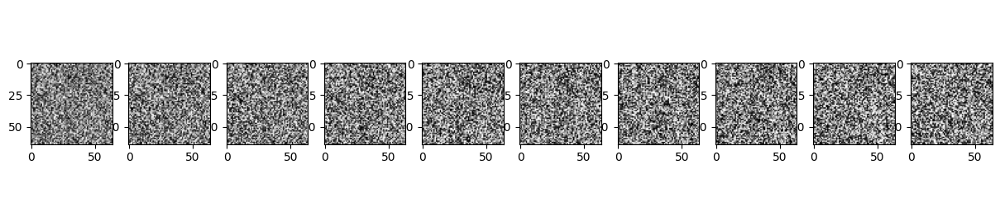

Epoch 5 | step 000 Loss: 0.19440780580043793 


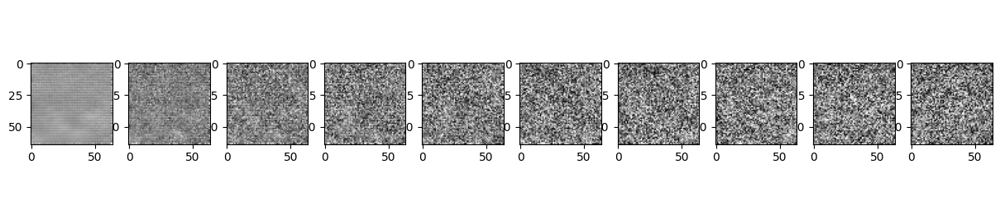

Epoch 10 | step 000 Loss: 0.13123619556427002 


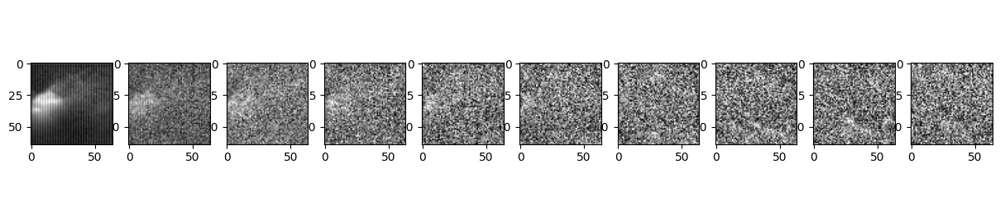

Epoch 15 | step 000 Loss: 0.11547693610191345 


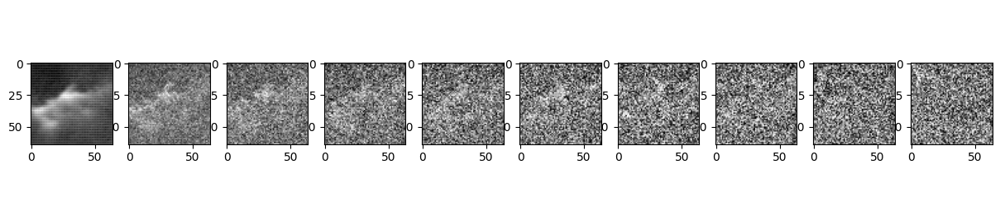

Epoch 20 | step 000 Loss: 0.10398860275745392 


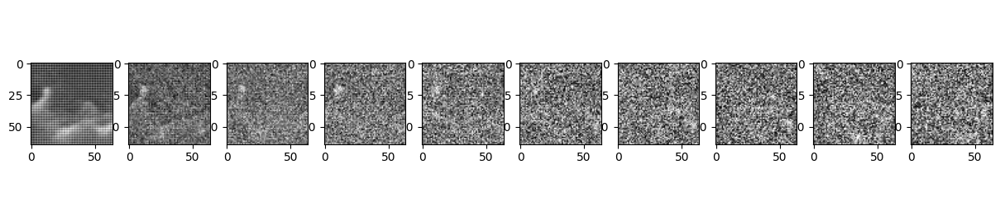

Epoch 25 | step 000 Loss: 0.10637921094894409 


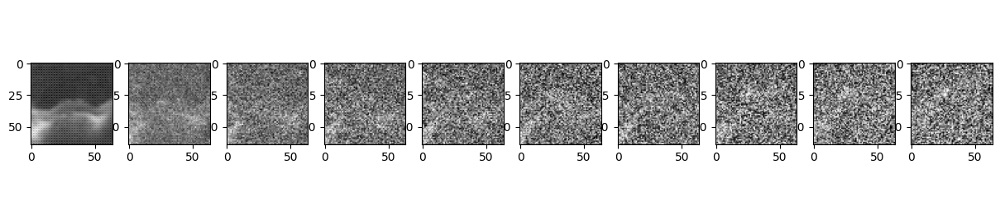

Epoch 30 | step 000 Loss: 0.10171589255332947 


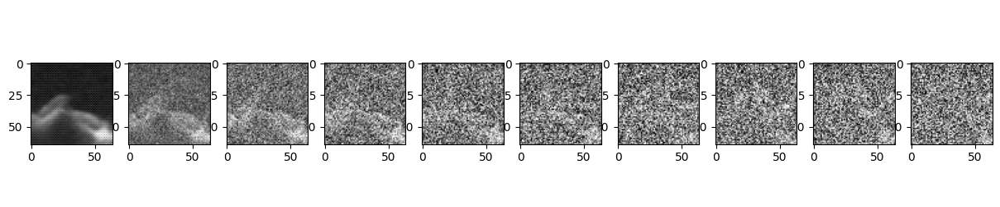

Epoch 35 | step 000 Loss: 0.0962861031293869 


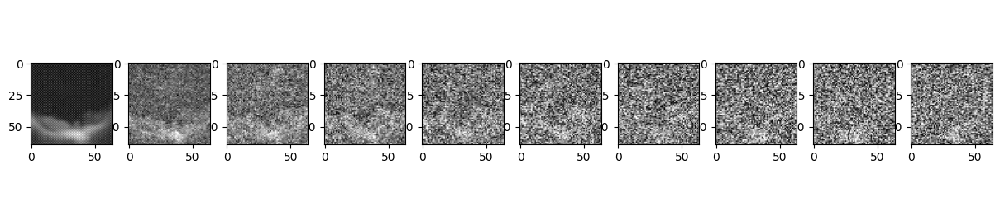

Epoch 40 | step 000 Loss: 0.0973527804017067 


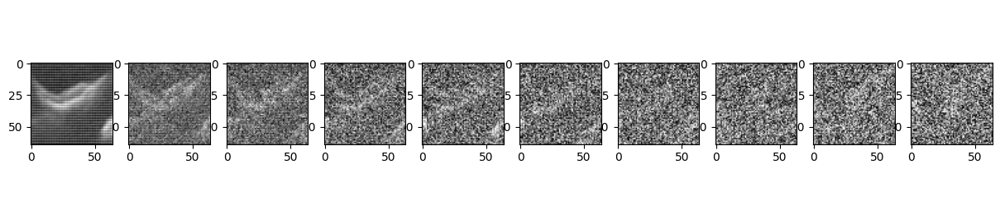

Epoch 45 | step 000 Loss: 0.09844642132520676 


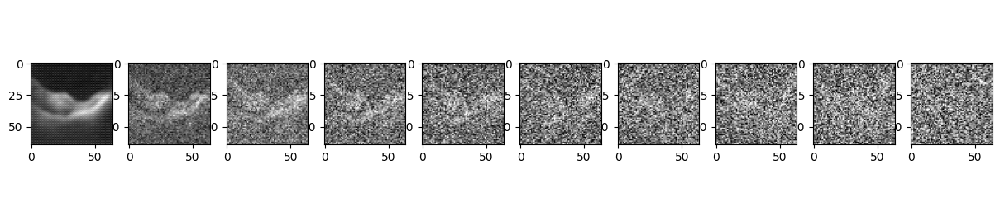

Epoch 50 | step 000 Loss: 0.08999984711408615 


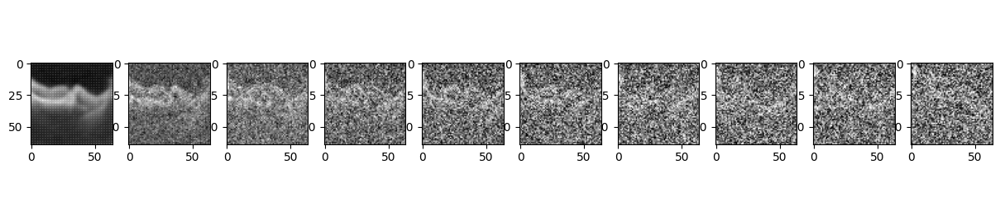

Epoch 55 | step 000 Loss: 0.09654801338911057 


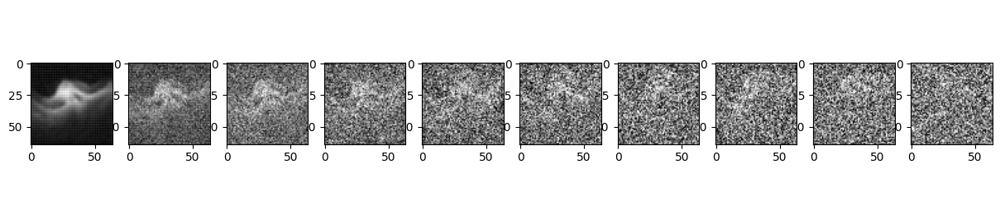

Epoch 60 | step 000 Loss: 0.0950063094496727 


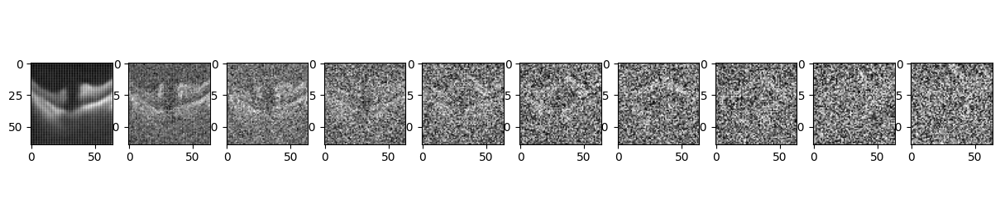

Epoch 65 | step 000 Loss: 0.107414111495018 


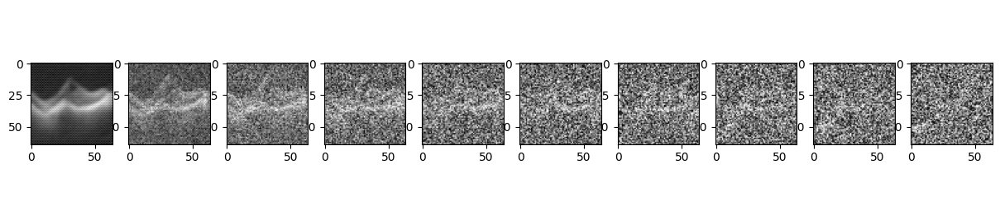

Epoch 70 | step 000 Loss: 0.1008296012878418 


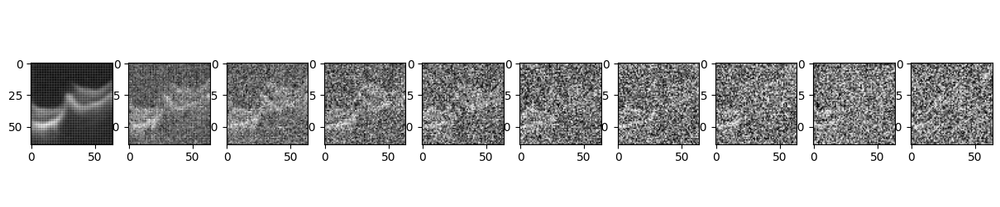

Epoch 75 | step 000 Loss: 0.08349435031414032 


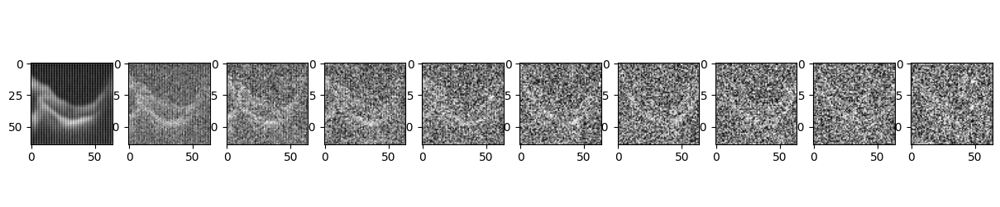

Epoch 80 | step 000 Loss: 0.08489058911800385 


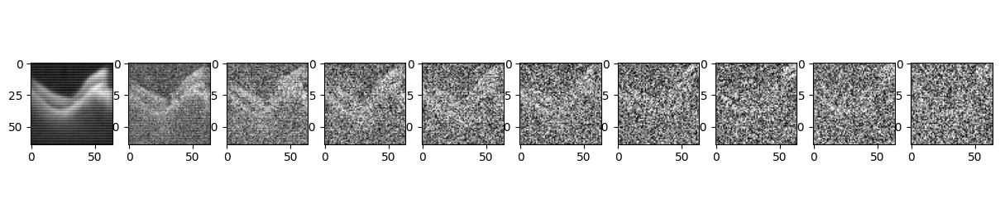

Epoch 85 | step 000 Loss: 0.07841092348098755 


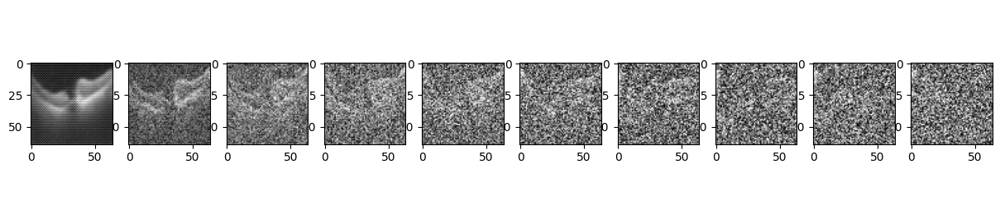

Epoch 90 | step 000 Loss: 0.08572597056627274 


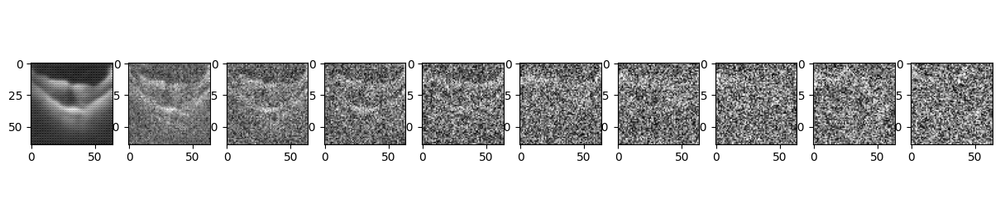

Epoch 95 | step 000 Loss: 0.09735332429409027 


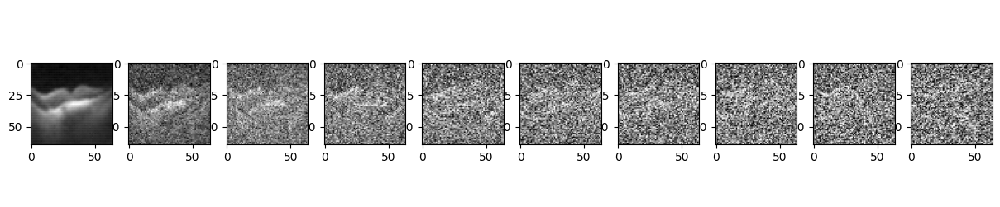

Epoch 100 | step 000 Loss: 0.08687169849872589 


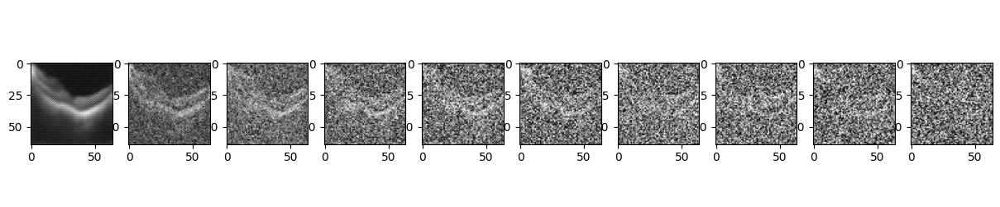

Epoch 105 | step 000 Loss: 0.08009597659111023 


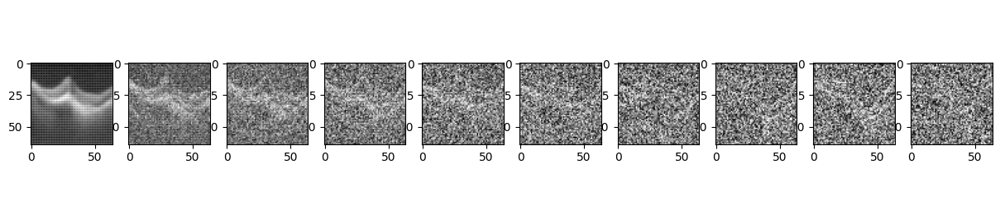

Epoch 110 | step 000 Loss: 0.08277103304862976 


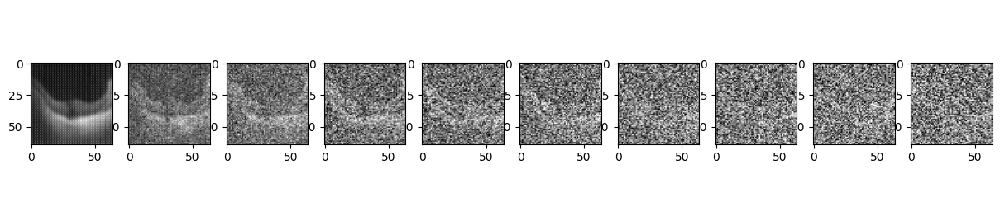

Epoch 115 | step 000 Loss: 0.08515474200248718 


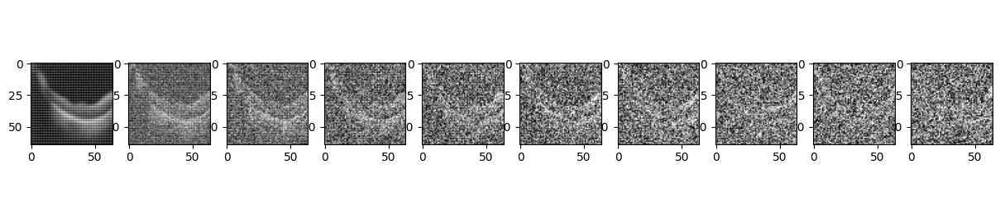

Epoch 120 | step 000 Loss: 0.08723825961351395 


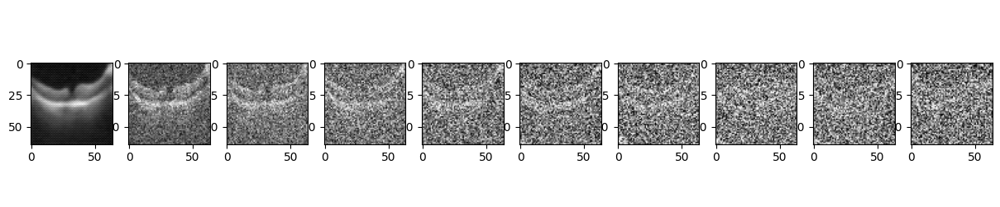

Epoch 125 | step 000 Loss: 0.09208294749259949 


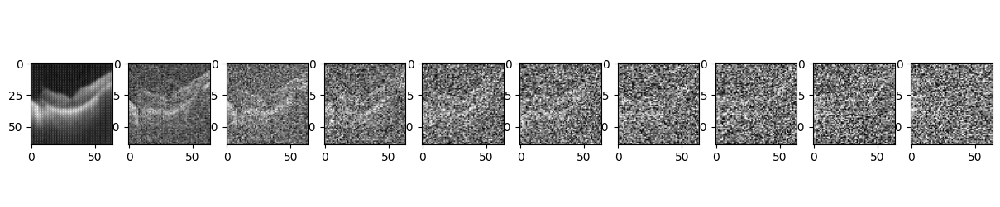

Epoch 130 | step 000 Loss: 0.07997949421405792 


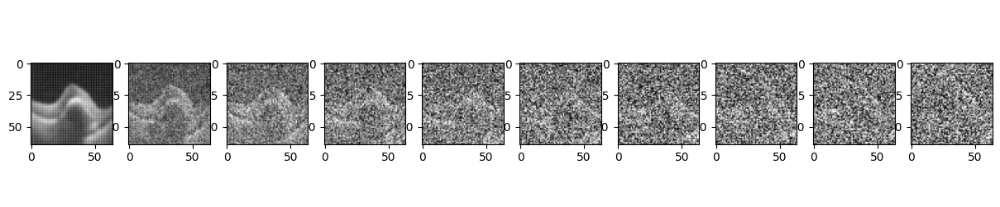

Epoch 135 | step 000 Loss: 0.07603859901428223 


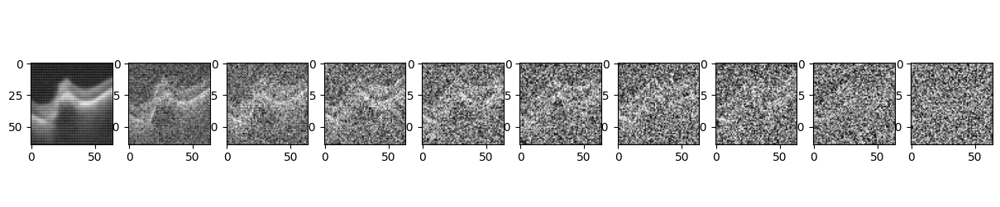

Epoch 140 | step 000 Loss: 0.07507617771625519 


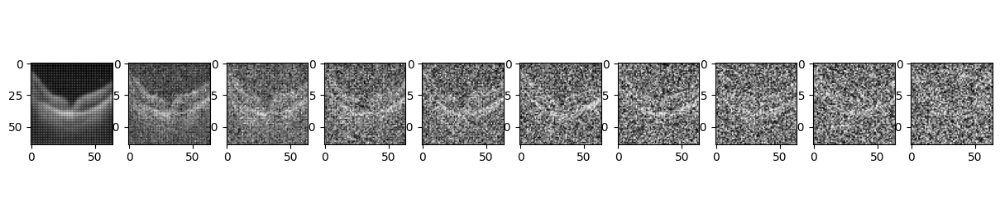

Epoch 145 | step 000 Loss: 0.08777162432670593 


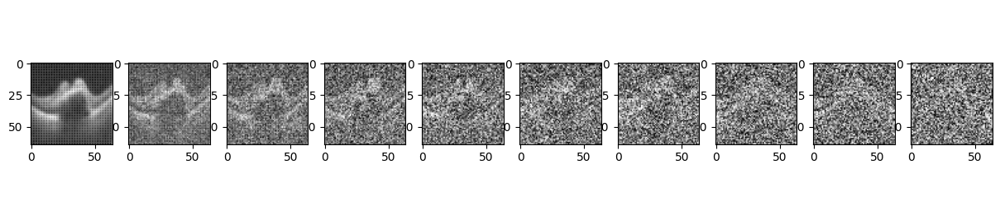

Epoch 150 | step 000 Loss: 0.08409114181995392 


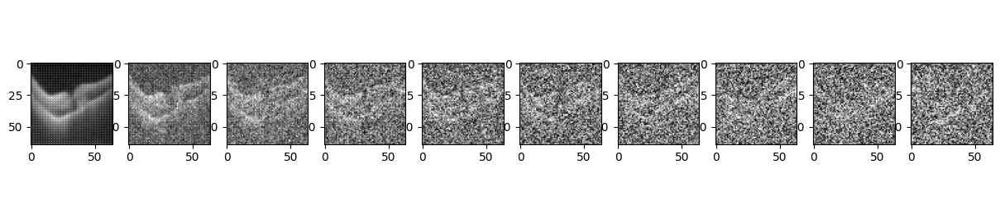

Epoch 155 | step 000 Loss: 0.07966993749141693 


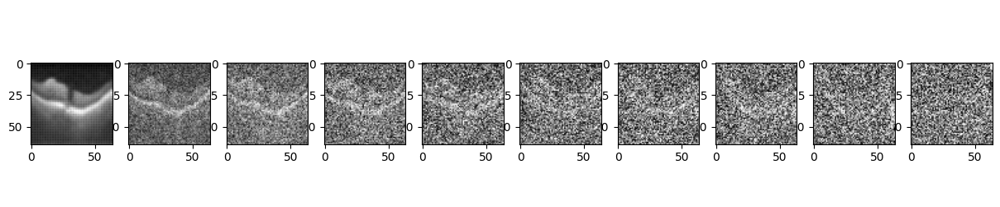

Epoch 160 | step 000 Loss: 0.07851266115903854 


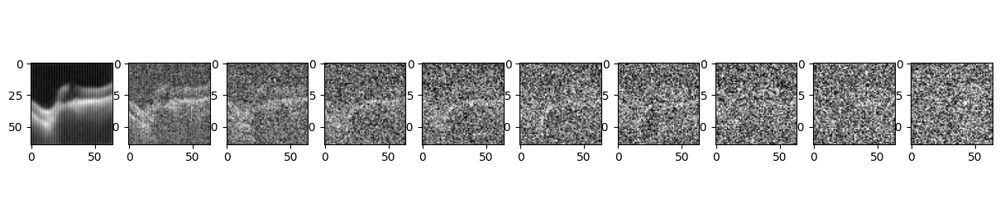

Epoch 165 | step 000 Loss: 0.07282677292823792 


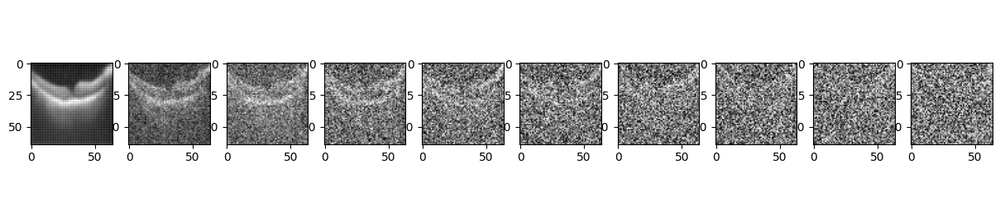

Epoch 170 | step 000 Loss: 0.08366186171770096 


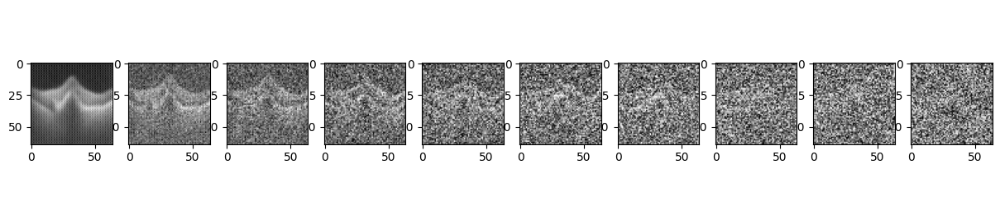

Epoch 175 | step 000 Loss: 0.08598091453313828 


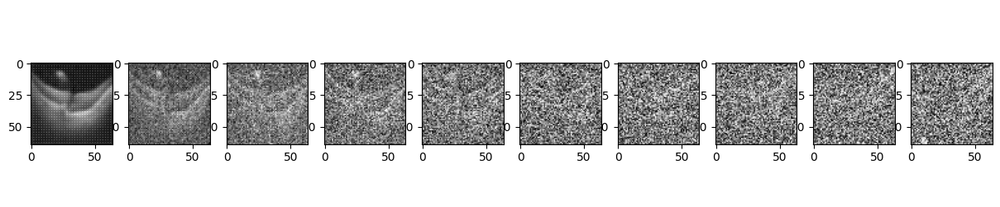

Epoch 180 | step 000 Loss: 0.07890117168426514 


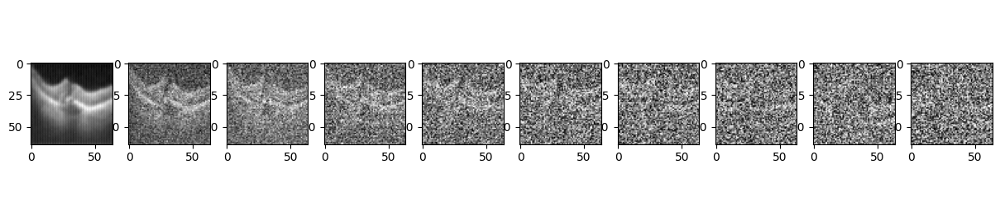

Epoch 185 | step 000 Loss: 0.08445034176111221 


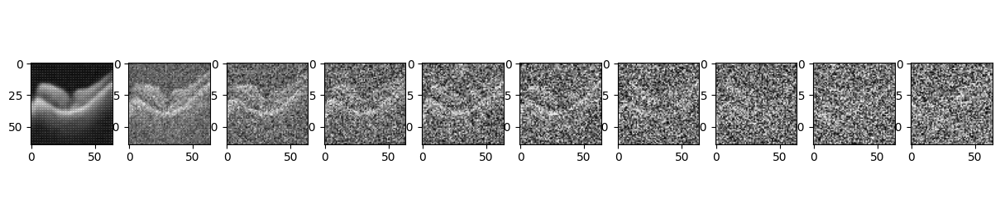

Epoch 190 | step 000 Loss: 0.08479057252407074 


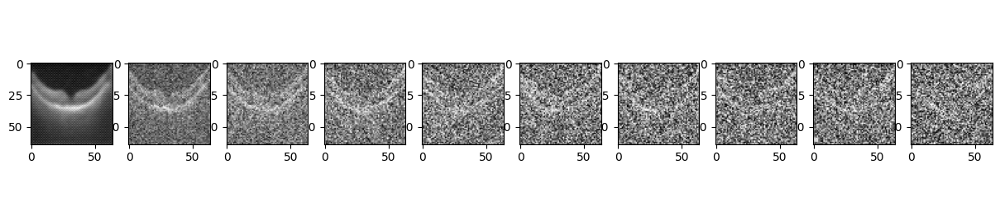

Epoch 195 | step 000 Loss: 0.0773908942937851 


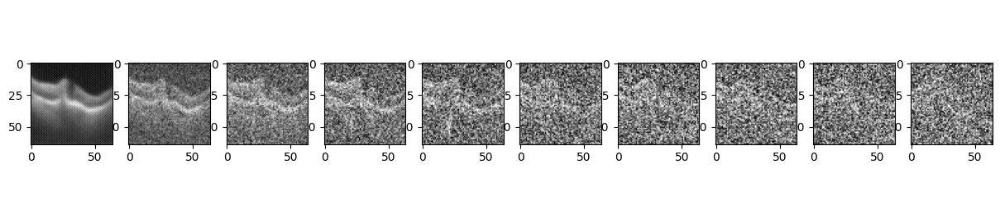

In [ ]:
from torch.optim import Adam

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 200 # Try more!

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
      optimizer.zero_grad()

      images, class_labels = batch[0].to(device), batch[1].to(device)

      t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
      loss = get_loss(model, images, t, class_labels)
      loss.backward()
      optimizer.step()

      if epoch % 5 == 0 and step == 0:
        print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
        sample_plot_image()

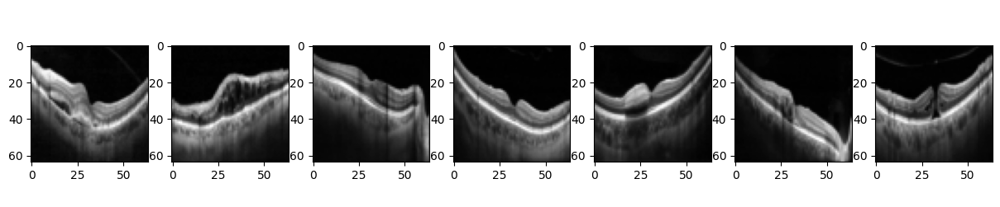

In [ ]:
plt.figure(figsize=(15, 3))
plt.axis('off')

# Assuming your dataloader yields batches of (image, label)
class_images = {i: None for i in range(7)}  # Dictionary to store one image per class

for batch in dataloader:
    images, labels = batch
    for i in range(len(images)):
        label = labels[i].item()
        if class_images[label] is None:
            class_images[label] = images[i]

    if all([v is not None for v in class_images.values()]):
        break  # Stop if we have one image for each class

# Display the images
for i, image in enumerate(class_images.values()):
    plt.subplot(1, 7, i + 1)  # Create subplots for 7 images
    show_tensor_image(image)

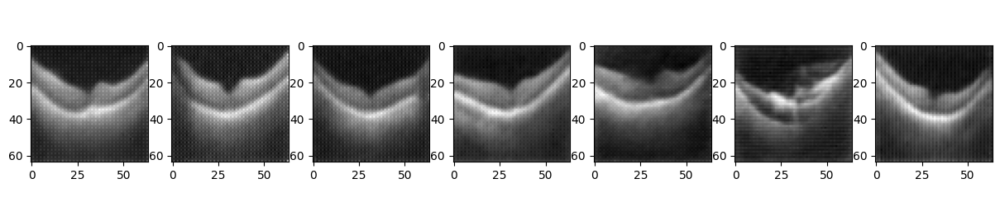

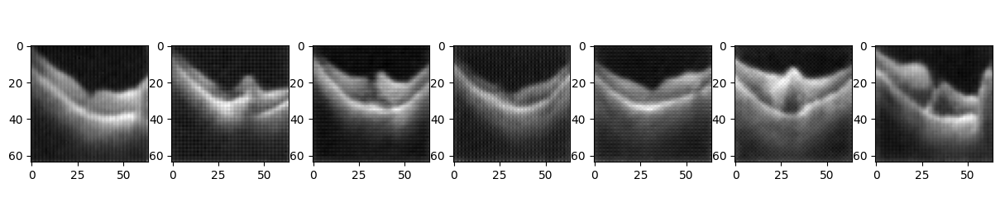

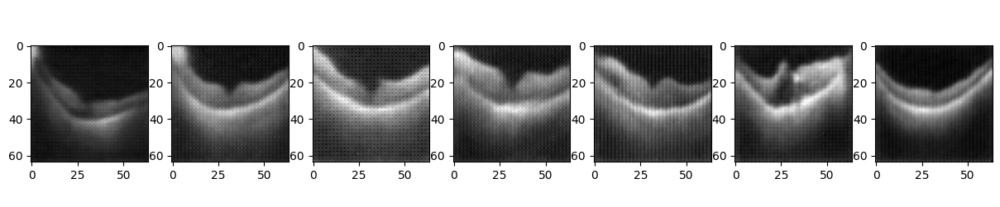

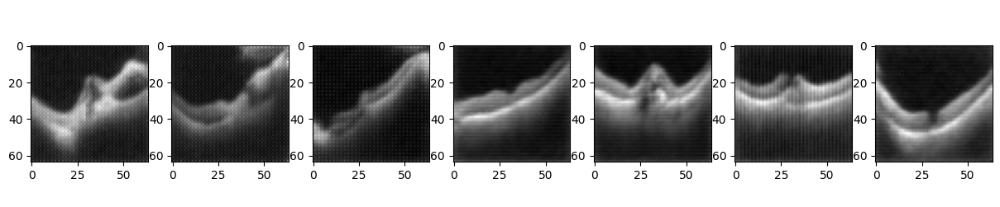

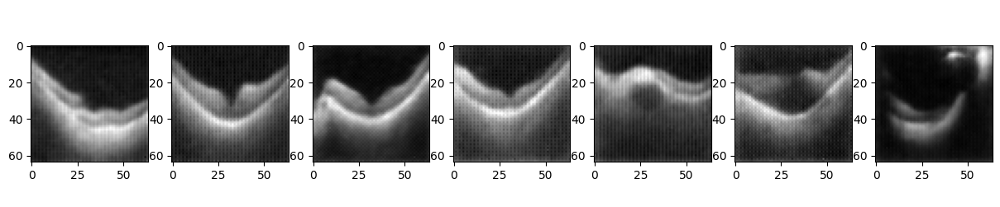

In [ ]:
for i in range(5):
  plot_n_images(7)
